In [51]:
import xarray as xr
import pandas as pd
import numpy as np
import warnings
from scipy import stats


### Read in NDVI data

In [15]:
ds=xr.open_mfdataset(
    '/g/data/oe9/user/rg6346/VI_mask_nc/NDVI/NDVI_????.nc',
    chunks=dict(long=176)) 
ds=ds.rename({'ndvi_evi':'ndvi'})
ds=ds.drop('band')
ds

<xarray.Dataset>
Dimensions:  (lat: 3147, long: 3344, time: 388)
Coordinates:
  * lat      (lat) float64 -24.59 -24.59 -24.6 -24.6 -24.6 -24.61 -24.61 ...
  * long     (long) float64 138.6 138.6 138.6 138.6 138.6 138.6 138.6 138.6 ...
  * time     (time) datetime64[ns] 2000-02-18 2000-03-05 2000-03-21 ...
Data variables:
    ndvi     (time, lat, long) float64 dask.array<shape=(388, 3147, 3344), chunksize=(20, 3147, 176)>

In [16]:
ds['ndvi']=ds.ndvi/10000;

### Resample to quarterly, extract seasons

In [33]:
ndvi_q=ds.ndvi.resample(time='Q-FEB').mean(dim='time')
ndvi_jja=ndvi_q.where(ndvi_q['time.season']=='JJA',drop=True)
ndvi_djf=ndvi_q.where(ndvi_q['time.season']=='DJF',drop=True)

# ndvi_jja=ndvi_jja.sel(lat=slice(-30.1, -31),long=slice(148.9,150.6))
# ndvi_jja
# ndvi_q

# ndvi_djf=ds.ndvi.where(ds.ndvi['time.season']=='DJF',drop=True)
# ndvi_djf
# # (3) using where and rolling
# # mask other months with nan
# ds_DJF = ds.where(ds['time.season'] == 'DJF')
# # rolling mean -> only Jan is not nan
# # however, we loose Jan/ Feb in the first year and Dec in the last
# ds_DJF = ds_DJF.rolling(min_periods=3, center=True, time=3).mean()
# # make annual mean
# ds_DJF = ds_DJF.groupby('time.year').mean('time')



# # This uses a series of tricks to come to the goal
# t2m_djf = ds.t2m.load().where(ds['time.season'] == 'DJF')
# t2m_djf = t2m_djf.rolling(min_periods=3, center=True, time=3).mean()
# t2m_djf = t2m_djf.groupby('time.year').mean('time')



## Plot ndvi as time series

In [ ]:
ndvi_jja.plot.imshow(col='time', robust=True,cmap='Greens',col_wrap=4)

### Geoviews Plot, DJF, JJA

In [18]:
import matplotlib.pyplot as plt
import holoviews as hv
import geoviews as gv
import geoviews.feature as gf
from cartopy import crs
hv.notebook_extension()
%matplotlib inline

In [19]:
%opts Image {+framewise} [colorbar=True]
%output max_frames=1000 
%output size=200
%opts Image [projection=crs.Miller()] (cmap='Greens')

:HoloMap   [time]
   :Image   [long,lat]   (ndvi)
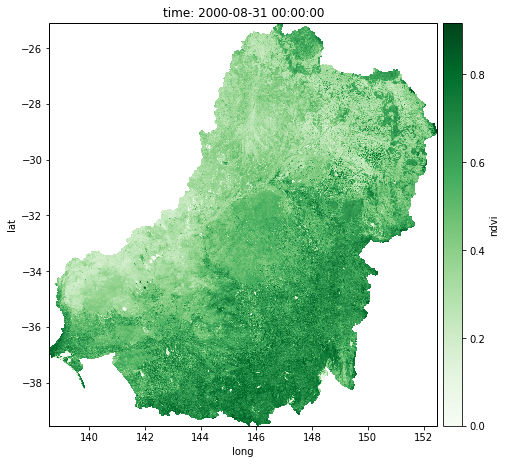
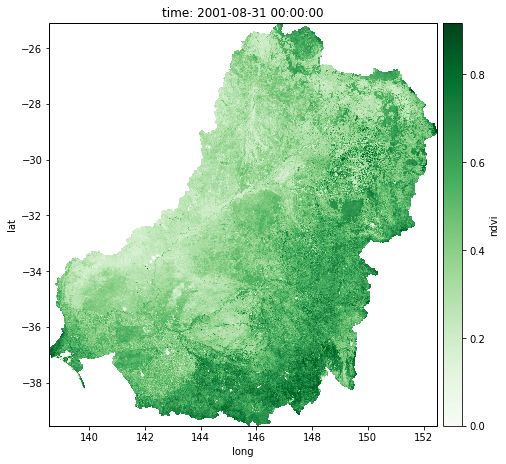
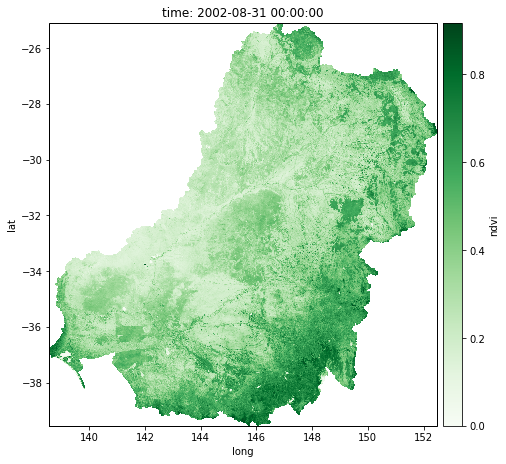
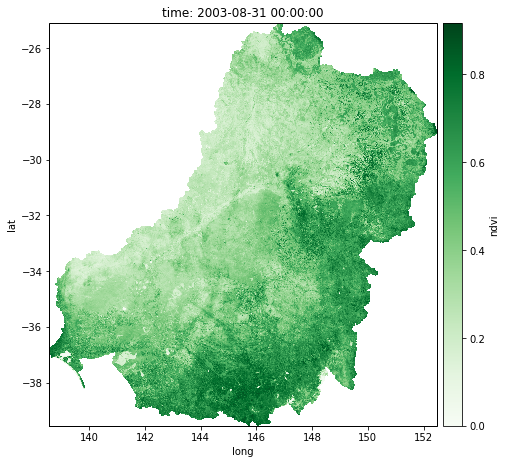
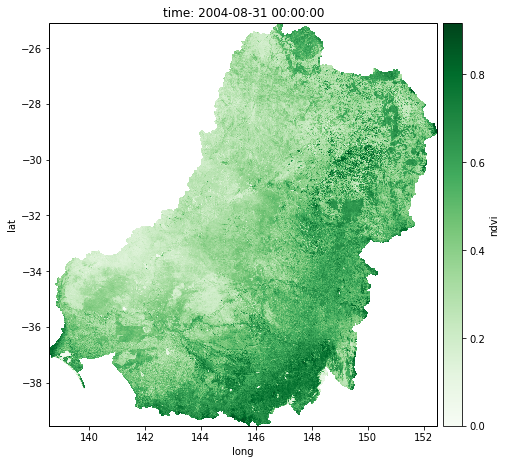
...
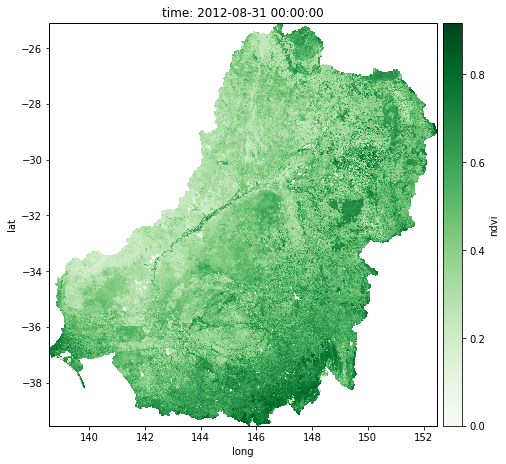
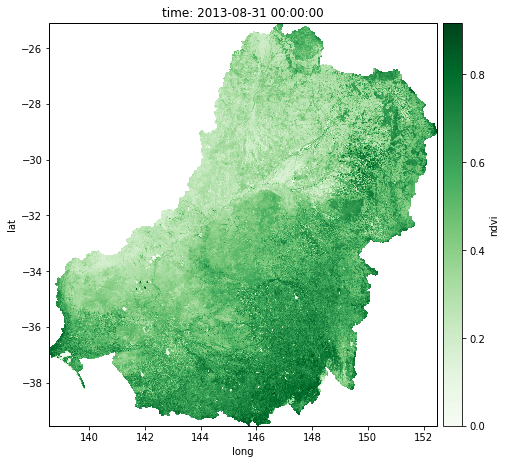
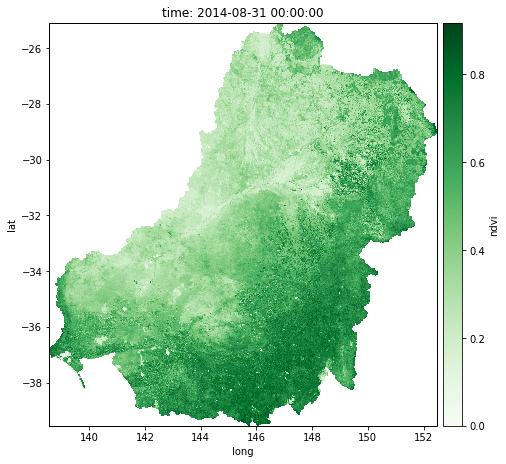
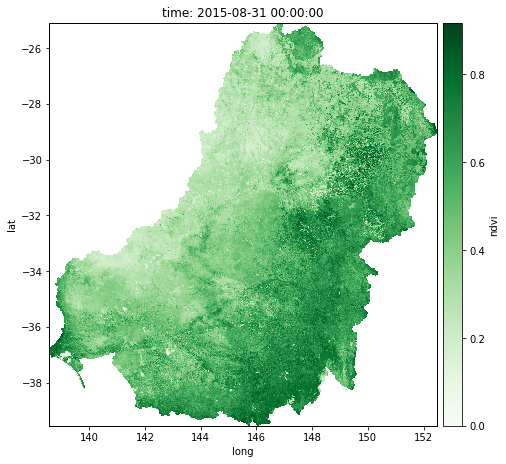
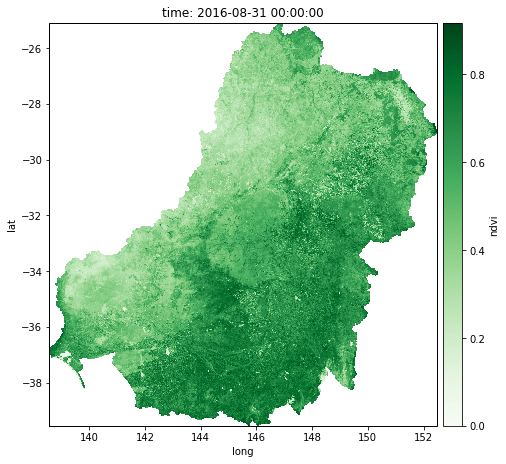

In [34]:
# with warnings.catch_warnings():
#     warnings.simplefilter("ignore", "RuntimeWarning")

warnings.filterwarnings('ignore')

kdims = ['time', 'long', 'lat']
vdims = ['ndvi']

ndvi_jja_gv = gv.Dataset(ndvi_jja, kdims=kdims, vdims=vdims)
ndvi_jja_gv.to(gv.Image, ['long', 'lat'])

:HoloMap   [time]
   :Image   [long,lat]   (ndvi)
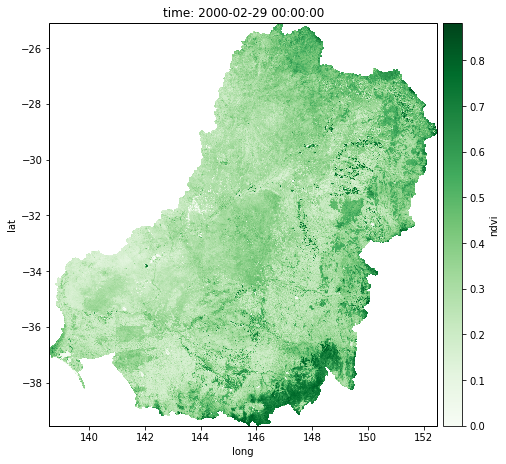
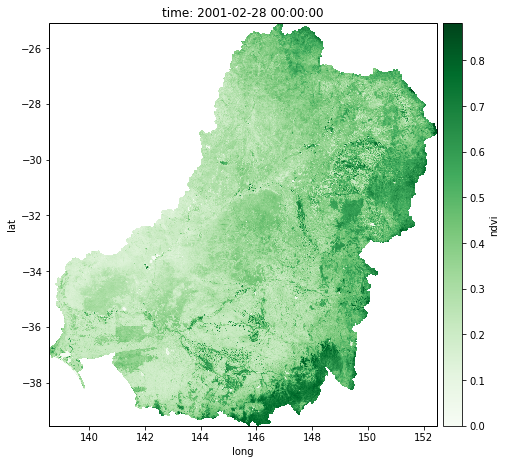
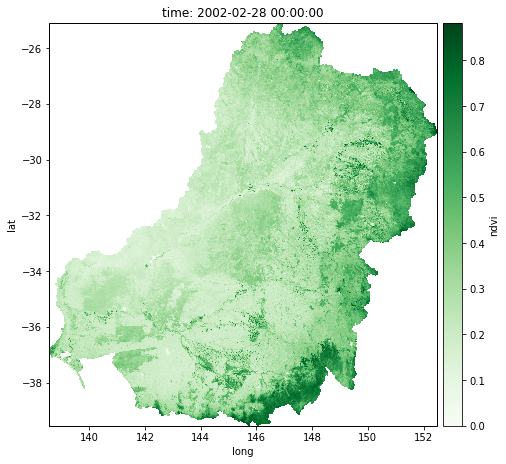
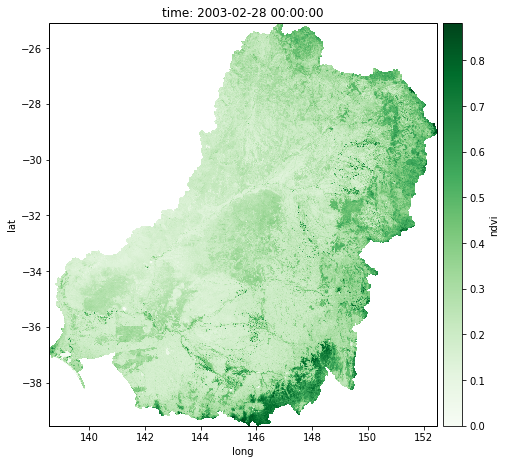
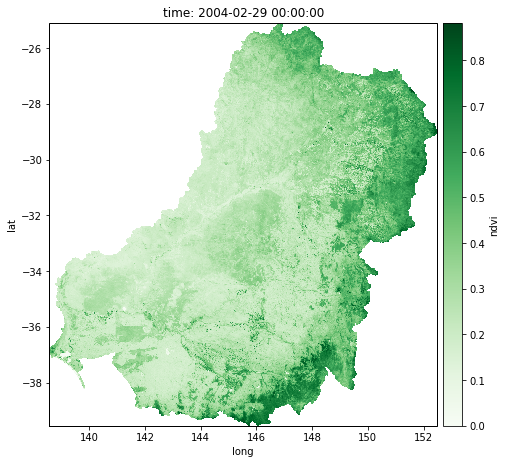
...
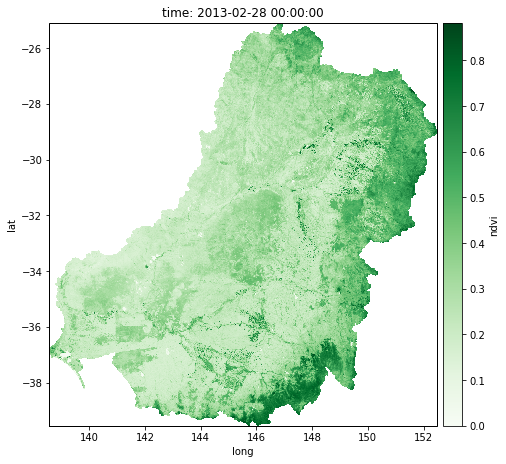
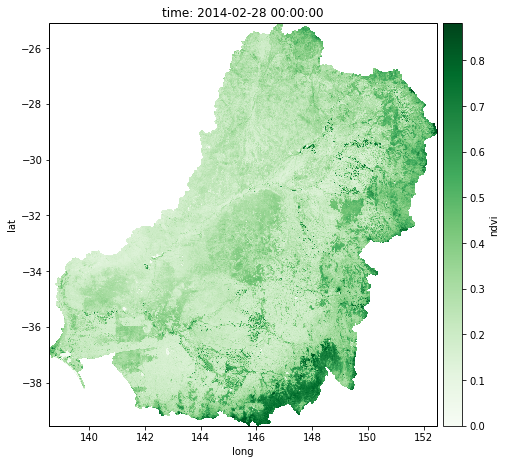
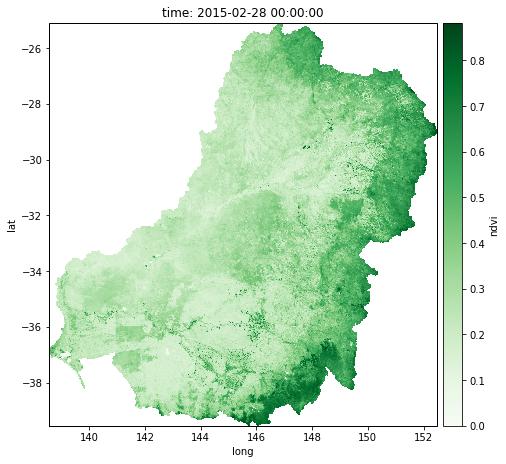
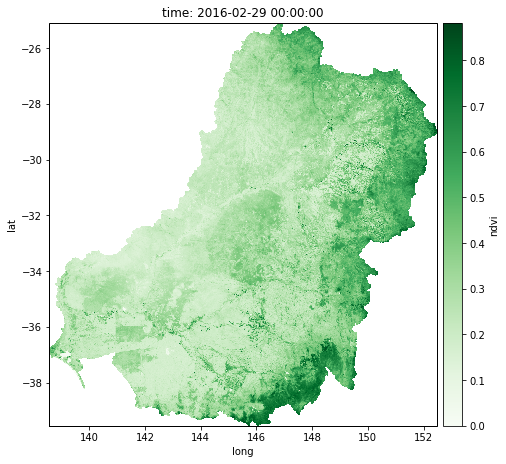
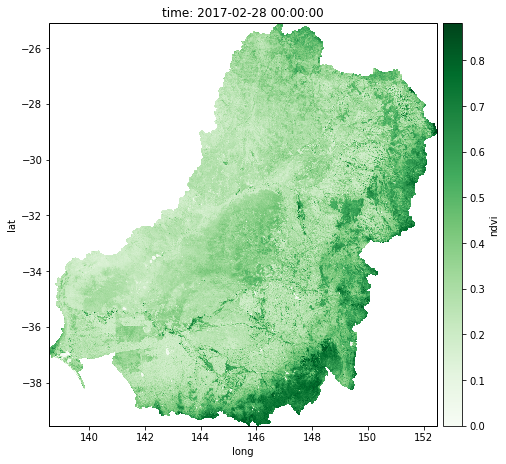

In [37]:
ndvi_djf_gv = gv.Dataset(ndvi_djf, kdims=kdims, vdims=vdims)
warnings.filterwarnings('ignore')

ndvi_djf_gv.to(gv.Image, ['long', 'lat'])

In [ ]:
# Matplotlib Animation Example

# author: Jake Vanderplas
# email: vanderplas@astro.washington.edu
# website: http://jakevdp.github.io/blog/2012/08/18/matplotlib-animation-tutorial/
# license: BSD
# Please feel free to use and modify this, but keep the above information. Thanks!

import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation

# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
ax = plt.axes(xlim=(0, 2), ylim=(-2, 2))
line, = ax.plot([], [], lw=2)

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    x = np.linspace(0, 2, 1000)
    y = np.sin(2 * np.pi * (x - 0.01 * i))
    line.set_data(x, y)
    return line,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=True)

# save the animation as an mp4.  This requires ffmpeg or mencoder to be
# installed.  The extra_args ensure that the x264 codec is used, so that
# the video can be embedded in html5.  You may need to adjust this for
# your system: for more information, see
# http://matplotlib.sourceforge.net/api/animation_api.html
anim.save('basic_animation.mp4', fps=30, extra_args=['-vcodec', 'libx264'])

plt.show()


In [42]:
##Calculate and plot seasonal variance
ndvi_jja_std=ndvi_jja.std(dim='time')
ndvi_djf_std=ndvi_djf.std(dim='time')


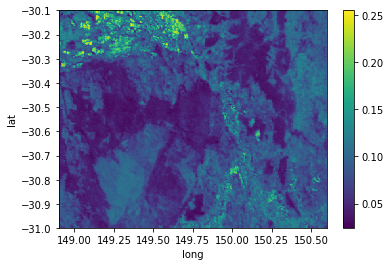

In [50]:
sub=ndvi_djf_std.sel(lat=slice(-30.1, -31),long=slice(148.9,150.6)) ##yarrie
sub.plot()

Text(0.5,1,'JJA variance')

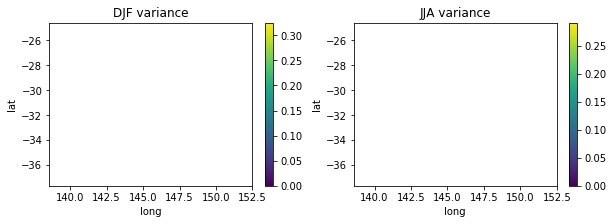

In [41]:
fig=plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
ndvi_djf_std.plot()
plt.title('DJF variance')
plt.subplot(1,2,2)
ndvi_jja_std.plot()
plt.title('JJA variance')


In [ ]:
fig.savefig('variance.pdf',bbox_inches='tight')

## Linear regression

In [ ]:
##need to adjust to do all pixels with ufunc
mask = ~np.isnan(sub_dot.ndvi) & ~np.isnan(sub_dot.days_since)
slope, intercept, r_sq, p_values, std_err = stats.linregress(sub_dot.days_since[mask],sub_dot.ndvi[mask])